In [95]:
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import h5py

In [87]:
timestep_file = "00000400.npz"
data = np.load(f"./npz/{timestep_file}")

In [88]:
print(data)

NpzFile './npz/00000400.npz' with keys: temperature, fraction_of_fluid, scl2, liquid_label, x...


In [89]:
print(data["temperature"].shape)

(150, 60, 59)


In [90]:
volume = data["temperature"]

In [116]:
unmelt_volume = np.where(volume < 500, np.nan, volume)
unmelt_volume = np.where(unmelt_volume > 1873, np.nan, unmelt_volume)
unmelt_volume = np.where(unmelt_volume > 0, 1, 0)
# unmelt_volume = unmelt_volume.astype(float)

with h5py.File("meltpool_low_temp.h5", "w") as h5file:
    h5file.create_dataset("3d", data=unmelt_volume, dtype="float")

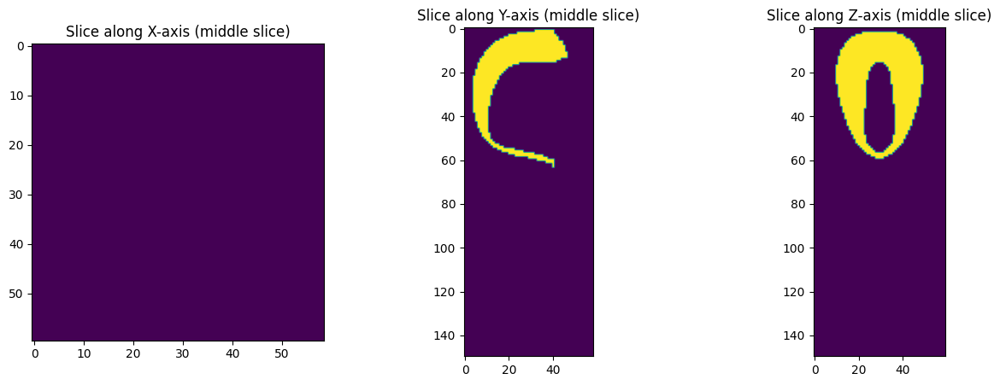

In [117]:
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Plot slices along the z-axis (e.g., middle slice)
axs[0].imshow(unmelt_volume[unmelt_volume.shape[0] // 2, :, :], cmap='viridis')
axs[0].set_title('Slice along X-axis (middle slice)')

# Plot slices along the x-axis (e.g., middle slice)
axs[1].imshow(unmelt_volume[:, unmelt_volume.shape[1] // 2, :], cmap='viridis')
axs[1].set_title('Slice along Y-axis (middle slice)')

# Plot slices along the y-axis (e.g., middle slice)
axs[2].imshow(unmelt_volume[:, :, unmelt_volume.shape[2] // 2], cmap='viridis')
axs[2].set_title('Slice along Z-axis (middle slice)')

# Show the plot
plt.show()

In [119]:
import numpy as np
from skimage import measure
from stl import mesh

# Extract the surface mesh using the marching cubes algorithm
verts, faces, normals, _ = measure.marching_cubes(unmelt_volume, level=0.5)

# Create the mesh
surface_mesh = mesh.Mesh(np.zeros(faces.shape[0], dtype=mesh.Mesh.dtype))
for i, f in enumerate(faces):
    for j in range(3):
        surface_mesh.vectors[i][j] = verts[f[j], :]

# Save the mesh to an STL file
surface_mesh.save('low_temp.stl')

In [93]:
melt_volume = np.where(volume < 1873, np.nan, volume)

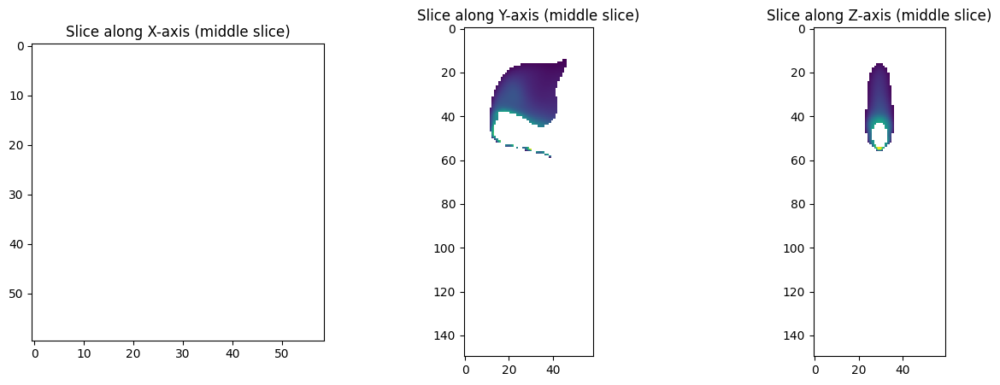

In [94]:
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Plot slices along the z-axis (e.g., middle slice)
axs[0].imshow(melt_volume[melt_volume.shape[0] // 2, :, :], cmap='viridis')
axs[0].set_title('Slice along X-axis (middle slice)')

# Plot slices along the x-axis (e.g., middle slice)
axs[1].imshow(melt_volume[:, melt_volume.shape[1] // 2, :], cmap='viridis')
axs[1].set_title('Slice along Y-axis (middle slice)')

# Plot slices along the y-axis (e.g., middle slice)
axs[2].imshow(melt_volume[:, :, melt_volume.shape[2] // 2], cmap='viridis')
axs[2].set_title('Slice along Z-axis (middle slice)')

# Show the plot
plt.show()

In [12]:
volume = data["temperature"]

# Create a 3D volume plot
fig = go.Figure(data=go.Volume(
    x=np.arange(volume.shape[0]),
    y=np.arange(volume.shape[1]),
    z=np.arange(volume.shape[2]),
    value=volume.flatten(),
    isomin=volume.min(),
    isomax=volume.max(),
    opacity=1,  # Adjust opacity for visibility
    # surface_count=20,  # Number of surfaces to plot
))

# Update layout with labels
fig.update_layout(
    title='3D Volume Plot',
    scene=dict(
        xaxis_title='X axis',
        yaxis_title='Y axis',
        zaxis_title='Z axis'
    )
)

# Show the plot
fig.show()